# Named Entity Word Clouds

Four sets of circular word clouds — font size ∝ mention frequency:

1. **Per news source** — AD, GA, NRC, NU.nl, Parool, TG, TR, VK  
2. **Per meta-topic** — 17 shared meta-topic categories  
3. **Per Tweede Kamer document type** — beleidsnota, plenair verslag, vergaderstuk  
4. **Per talkshow programme** — 9 Dutch talk shows  

Entity type is selectable via `ENTITY_TYPE` (`PER`, `ORG`, `LOC`, or `ALL`).


In [87]:
import pathlib

HERE = pathlib.Path(".")

# ── Input files (relative to this notebook) ──────────────────────────────────
SOURCE_NODES_CSV   = HERE / "../old/source_entity_nodes.csv"
SOURCE_EDGES_CSV   = HERE / "../old/source_entity_edges.csv"
META_NODES_CSV     = HERE / "../old/metatopic_entity_nodes.csv"
META_EDGES_CSV     = HERE / "../old/metatopic_entity_edges.csv"

# ── Filter ────────────────────────────────────────────────────────────────────
# "PER"  → persons only
# "ORG"  → organisations only
# "LOC"  → locations only
# "ALL"  → all entity types
ENTITY_TYPE = "PER"

# Top N entities shown per cloud (keeps clouds readable)
TOP_N = 50

# ── Output ────────────────────────────────────────────────────────────────────
OUT_SOURCE = HERE / f"wordclouds_per_source_{ENTITY_TYPE.lower()}.png"
OUT_META   = HERE / f"wordclouds_per_metatopic_{ENTITY_TYPE.lower()}.png"
FIG_DPI    = 200

# ── Appearance ────────────────────────────────────────────────────────────────
# Neutral greyscale base; each source gets a subtle tint (see TINTS below)
BG_COLOR     = "white"
MIN_FONT     = 9
MAX_FONT     = 90


In [88]:
import warnings, math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from PIL import Image
from wordcloud import WordCloud

warnings.filterwarnings("ignore")


## Step 1 — Load and prepare data

In [89]:
# ── Helpers ───────────────────────────────────────────────────────────────────

def circular_mask(size=600):
    y, x = np.ogrid[:size, :size]
    cx, cy = size / 2, size / 2
    mask = (x - cx)**2 + (y - cy)**2 > (size / 2 - 2)**2
    arr = np.zeros((size, size), dtype=np.uint8)
    arr[mask] = 255
    return arr


def load_graph(nodes_csv, edges_csv, group_col, group_type):
    nodes = pd.read_csv(nodes_csv)
    edges = pd.read_csv(edges_csv)

    grp_nodes = (nodes[nodes["node_type"] == group_type]
                 [["Id", "Label", "size"]]
                 .rename(columns={"Id": "grp_id", "Label": "group", "size": "grp_total"}))

    ent_nodes = (nodes[nodes["node_type"] == "entity"]
                 [["Id", "Label", "entity_type"]]
                 .rename(columns={"Id": "ent_id", "Label": "entity"}))

    df = (edges
          .merge(grp_nodes, left_on="Source", right_on="grp_id")
          .merge(ent_nodes, left_on="Target",  right_on="ent_id")
          [["group", "grp_total", "entity", "entity_type", "Weight"]])

    df["count"] = (df["Weight"] * df["grp_total"]).round().astype(int)
    df = df[df["count"] > 0]
    return df[["group", "entity", "entity_type", "count"]]


src_df  = load_graph(SOURCE_NODES_CSV, SOURCE_EDGES_CSV,
                     group_col="source", group_type="news")
meta_df = load_graph(META_NODES_CSV,   META_EDGES_CSV,
                     group_col="metatopic", group_type="metatopic")

# ── Split by entity type ──────────────────────────────────────────────────────
def filter_type(df, etype):
    return df[df["entity_type"] == etype].copy()

src_per  = filter_type(src_df,  "PER")
src_org  = filter_type(src_df,  "ORG")
src_loc  = filter_type(src_df,  "LOC")

meta_per = filter_type(meta_df, "PER")
meta_org = filter_type(meta_df, "ORG")
meta_loc = filter_type(meta_df, "LOC")

for _df in [meta_per, meta_org, meta_loc]:
    _df.drop(_df[_df["group"] == "UNKNOWN"].index, inplace=True)

for label, df in [("src  PER", src_per), ("src  ORG", src_org), ("src  LOC", src_loc),
                  ("meta PER", meta_per), ("meta ORG", meta_org), ("meta LOC", meta_loc)]:
    print(f"{label}: {len(df):,} rows, {df['group'].nunique()} groups")

src  PER: 51,220 rows, 8 groups
src  ORG: 33,201 rows, 8 groups
src  LOC: 15,839 rows, 8 groups
meta PER: 55,793 rows, 17 groups
meta ORG: 37,203 rows, 17 groups
meta LOC: 18,919 rows, 17 groups


## Step 2 — Word clouds per source

Saved → wordclouds_per_source_per.png


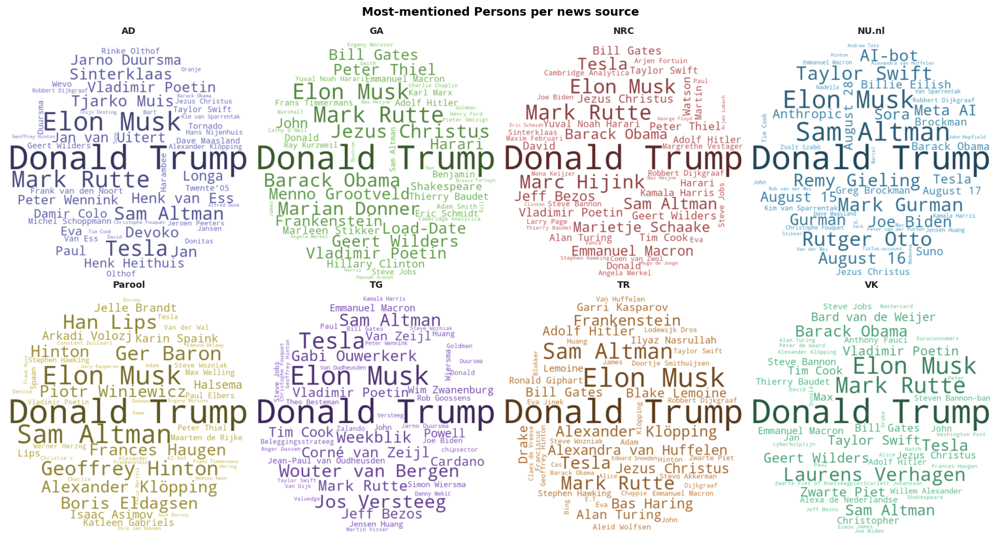

Saved → wordclouds_per_source_org.png


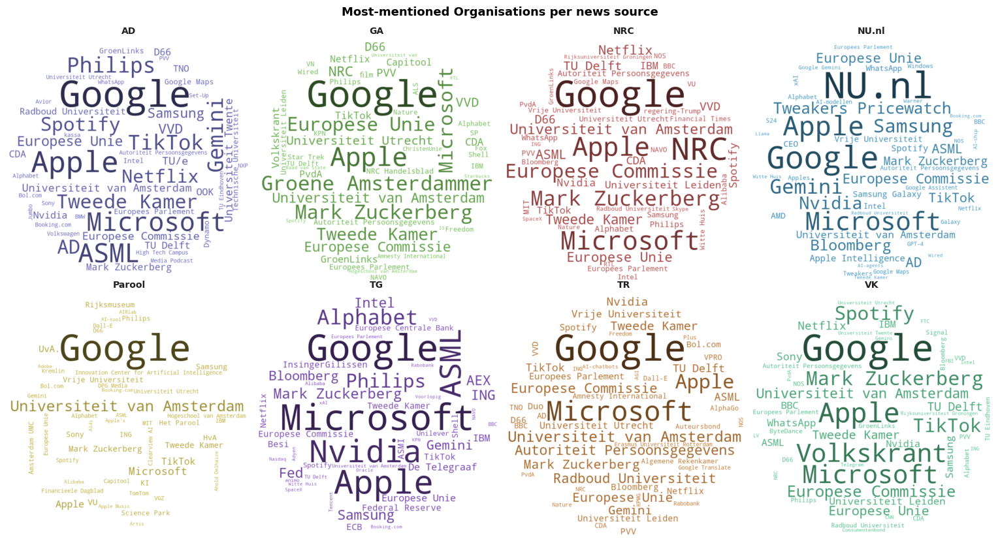

Saved → wordclouds_per_source_loc.png


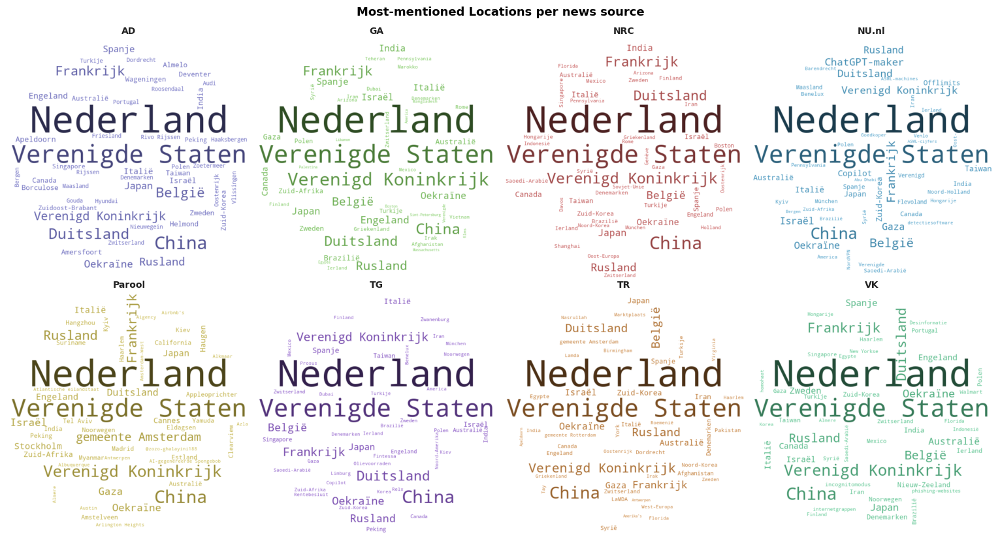

In [90]:
SOURCE_TINTS = {
    "AD":     "#1a1a2e",
    "GA":     "#2d4a22",
    "NRC":    "#3b1a1a",
    "NU.nl":  "#1a3a4a",
    "Parool": "#2e2a10",
    "TG":     "#2a1a3e",
    "TR":     "#3a2510",
    "VK":     "#1a3a2a",
}
DEFAULT_TINT = "#1a1a1a"


def make_cloud(freq_dict, mask, color_func=None, bg=BG_COLOR):
    wc = WordCloud(
        background_color=bg,
        mask=mask,
        max_words=TOP_N,
        min_font_size=MIN_FONT,
        max_font_size=MAX_FONT,
        prefer_horizontal=0.85,
        color_func=color_func,
        collocations=False,
        random_state=42,
    )
    wc.generate_from_frequencies(freq_dict)
    return wc


def tint_color_func(tint_hex):
    r, g, b = mcolors.to_rgb(tint_hex)
    h, s, v = mcolors.rgb_to_hsv((r, g, b))

    def _fn(word, font_size, position, orientation, random_state=None, **kw):
        light = 0.15 + 0.55 * (1 - font_size / MAX_FONT)
        rgb = mcolors.hsv_to_rgb((h, max(0.2, s), light + 0.15))
        return tuple(int(c * 255) for c in rgb)
    return _fn


def plot_wordclouds(grouped_df, group_col, tint_map, ncols, title, out_path=None):
    groups  = sorted(grouped_df[group_col].unique())
    ngroups = len(groups)
    nrows   = math.ceil(ngroups / ncols)
    mask    = circular_mask(600)

    fig, axes = plt.subplots(
        nrows, ncols,
        figsize=(ncols * 3.8, nrows * 3.8 + 0.6),
        facecolor="white",
    )
    axes_flat = np.array(axes).flatten()

    for ax in axes_flat:
        ax.set_visible(False)

    for i, group in enumerate(groups):
        ax = axes_flat[i]
        ax.set_visible(True)

        subset    = grouped_df[grouped_df[group_col] == group]
        freq_dict = dict(zip(subset["entity"], subset["count"]))

        if not freq_dict:
            ax.set_title(group, fontsize=9, pad=4)
            ax.axis("off")
            continue

        tint   = tint_map.get(group, DEFAULT_TINT)
        cfunc  = tint_color_func(tint)
        wc     = make_cloud(freq_dict, mask.copy(), color_func=cfunc)

        ax.imshow(wc, interpolation="bilinear")
        ax.set_title(group, fontsize=10, fontweight="bold", pad=5, color="#222222")
        ax.axis("off")

    fig.suptitle(title, fontsize=13, fontweight="bold", y=1.01)
    fig.tight_layout(pad=0.3)
    if out_path is not None:
        fig.savefig(out_path, dpi=FIG_DPI, bbox_inches="tight", facecolor="white")
        print(f"Saved → {out_path}")
    plt.show()


src_tint_map = {g: SOURCE_TINTS.get(g, DEFAULT_TINT) for g in src_per["group"].unique()}

for _etype, _df, _fname in [("Persons",       src_per, "per"),
                              ("Organisations",  src_org, "org"),
                              ("Locations",      src_loc, "loc")]:
    plot_wordclouds(_df, "group", src_tint_map, 4,
        f"Most-mentioned {_etype} per news source",
        out_path=HERE / f"wordclouds_per_source_{_fname}.png")

## Step 3 — Word clouds per meta-topic

Saved → wordclouds_per_metatopic_per.png


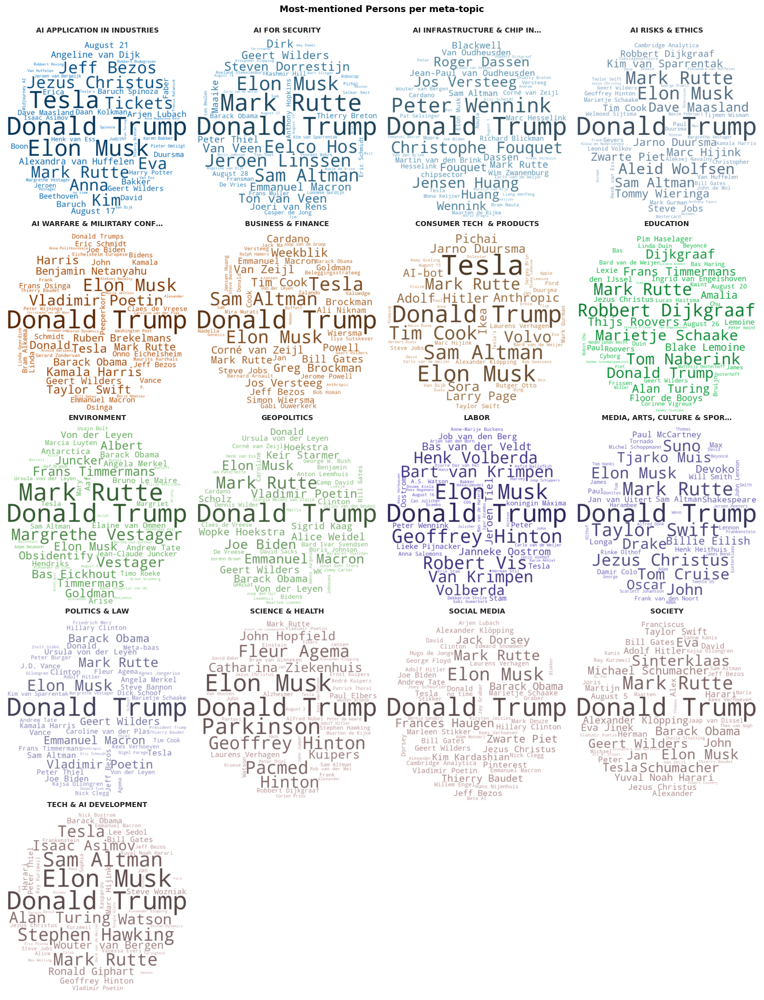

Saved → wordclouds_per_metatopic_org.png


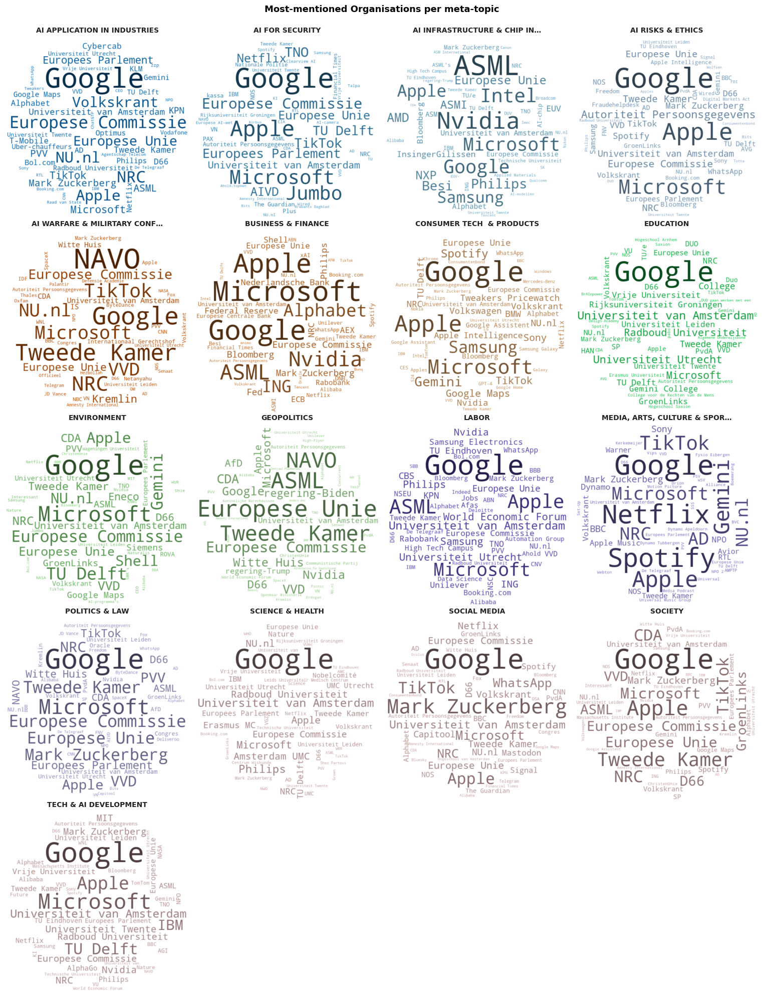

Saved → wordclouds_per_metatopic_loc.png


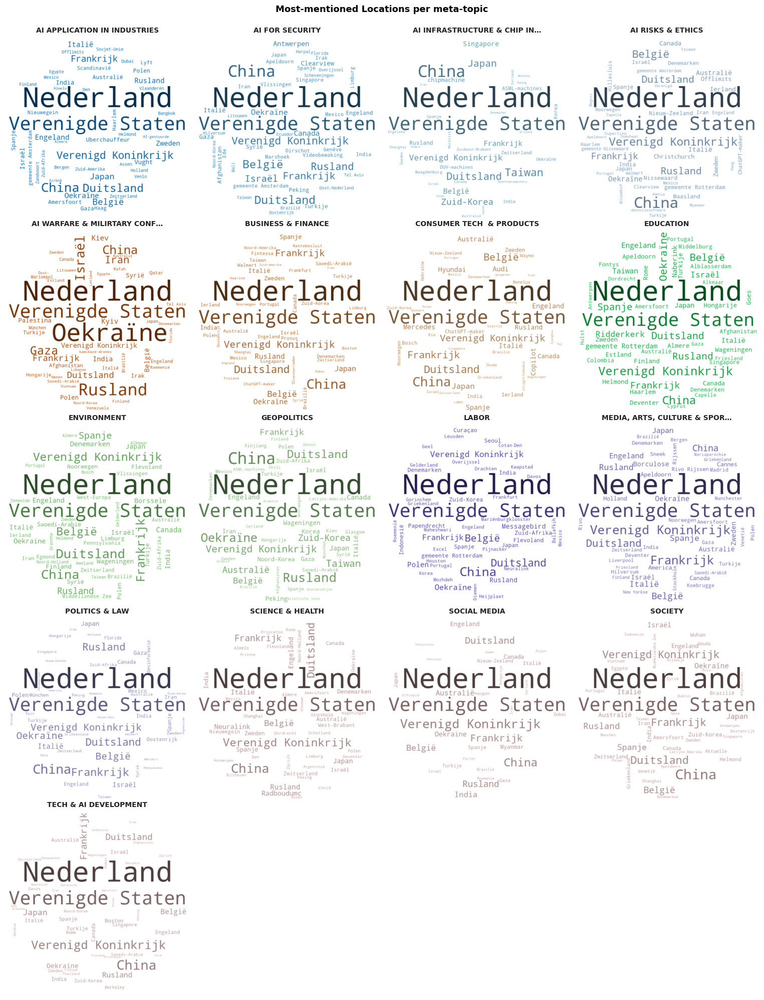

In [91]:
import matplotlib.cm as mcm

def build_meta_tints(meta_topics):
    cmap  = mcm.get_cmap("tab20c", len(meta_topics))
    tints = {}
    for i, m in enumerate(sorted(meta_topics)):
        r, g, b, _ = cmap(i)
        h, s, v = mcolors.rgb_to_hsv((r, g, b))
        dark_rgb = mcolors.hsv_to_rgb((h, min(1.0, s + 0.2), max(0.2, v - 0.35)))
        tints[m] = mcolors.to_hex(dark_rgb)
    return tints

meta_tints = build_meta_tints(meta_per["group"].unique())

def abbrev(label, maxlen=28):
    return label if len(label) <= maxlen else label[:maxlen-1].rstrip() + "…"

meta_tints_disp = {abbrev(k): v for k, v in meta_tints.items()}

# meta_per_disp kept for summary cell
meta_per_disp = meta_per.copy()
meta_per_disp["group"] = meta_per_disp["group"].apply(abbrev)

for _etype, _df, _fname in [("Persons",       meta_per, "per"),
                              ("Organisations",  meta_org, "org"),
                              ("Locations",      meta_loc, "loc")]:
    _df_disp = _df.copy()
    _df_disp["group"] = _df_disp["group"].apply(abbrev)
    plot_wordclouds(_df_disp, "group", meta_tints_disp, 4,
        f"Most-mentioned {_etype} per meta-topic",
        out_path=HERE / f"wordclouds_per_metatopic_{_fname}.png")

## Step 4 — Summary: top entities per group

In [92]:
def top_entities_table(df, group_col, n=5):
    """Print the top-n entities for every group in a compact table."""
    for group in sorted(df[group_col].unique()):
        top = (df[df[group_col] == group]
               .nlargest(n, "count")[["entity", "count"]]
               .reset_index(drop=True))
        top.index += 1
        print(f"{'─' * 48}")
        print(f"  {group}")
        print(top.to_string(index=True))
    print(f"{'─' * 48}")


print("=" * 48)
print(f"TOP ENTITIES PER SOURCE  (type={ENTITY_TYPE})")
print("=" * 48)
top_entities_table(src_per, "group", n=5)

print()
print("=" * 48)
print(f"TOP ENTITIES PER META-TOPIC  (type={ENTITY_TYPE})")
print("=" * 48)
top_entities_table(meta_per, "group", n=5)


TOP ENTITIES PER SOURCE  (type=PER)
────────────────────────────────────────────────
  AD
         entity  count
1  Donald Trump    164
2     Elon Musk     92
3    Mark Rutte     71
4         Tesla     60
5    Sam Altman     43
────────────────────────────────────────────────
  GA
           entity  count
1    Donald Trump     88
2      Mark Rutte     29
3       Elon Musk     28
4    Barack Obama     21
5  Jezus Christus     21
────────────────────────────────────────────────
  NRC
         entity  count
1  Donald Trump    326
2    Mark Rutte     82
3     Elon Musk     75
4   Marc Hijink     66
5         Tesla     52
────────────────────────────────────────────────
  NU.nl
         entity  count
1  Donald Trump     73
2    Sam Altman     40
3     Elon Musk     36
4   Rutger Otto     23
5   Mark Gurman     20
────────────────────────────────────────────────
  Parool
            entity  count
1     Donald Trump     16
2        Elon Musk      9
3       Sam Altman      9
4  Geoffrey Hinton

---
## Step 5 — Word clouds per Tweede Kamer document type

Source: `tweede_kamer/analysis/Tweede_Kamer_with_NER.csv`  
Groups: **beleidsnota**, **plenair verslag**, **vergaderstuk**  
Three separate figures: **Persons**, **Organisations**, **Locations**

All three entity types are canonicalised via the three sheets of `entity_review.xlsx`
(`PER`, `ORG`, `LOC`): only `keep=yes` entries survive, and raw variants are mapped
to their canonical form (e.g. "Trump" → "Donald Trump", "Amazon" → dropped, "VS" → "VS").

In [93]:
import ast

TK_CSV      = HERE / "../../../tweede_kamer/analysis/Tweede_Kamer_with_NER.csv"
REVIEW_XLSX = HERE / "../../../Comparative_visualisations/Entity-NER/data/entity_review.xlsx"
TK_COL_MAP  = {"PER": "persons", "ORG": "orgs", "LOC": "countries", "ALL": None}

TK_TINTS = {
    "beleidsnota":     "#1a2e4a",
    "plenair verslag": "#2e1a1a",
    "vergaderstuk":    "#1a2e1a",
}

# ── Shared helpers (also used by Step 6 — talkshows) ─────────────────────────
def parse_list_col(series):
    def _safe(v):
        try:    return ast.literal_eval(v)
        except: return []
    return series.fillna("[]").apply(_safe)

def load_ner_from_doc_csv(csv_path, group_col, entity_col_or_cols):
    df   = pd.read_csv(csv_path)
    cols = [entity_col_or_cols] if isinstance(entity_col_or_cols, str) else entity_col_or_cols
    rows = []
    for col in cols:
        if col not in df.columns: continue
        df[f"_{col}_p"] = parse_list_col(df[col])
        rows.append(df[[group_col, f"_{col}_p"]].explode(f"_{col}_p")
                      .rename(columns={f"_{col}_p": "entity"}))
    combined = pd.concat(rows, ignore_index=True)
    combined["entity"] = combined["entity"].astype(str).str.strip()
    combined = combined[combined["entity"].str.len() > 2]
    return (combined.groupby([group_col, "entity"]).size()
            .reset_index(name="count").rename(columns={group_col: "group"}))

# ── Build canonical maps from all three xlsx sheets ───────────────────────────
def _build_canon_map(sheet):
    df = pd.read_excel(REVIEW_XLSX, sheet_name=sheet)
    kept = df[df["keep"] == "yes"]
    return dict(zip(kept["entity"], kept["canonical"]))

CANON_PER = _build_canon_map("PER")
CANON_ORG = _build_canon_map("ORG")
CANON_LOC = _build_canon_map("LOC")
print(f"Entity review loaded — PER: {len(CANON_PER)}, ORG: {len(CANON_ORG)}, LOC: {len(CANON_LOC)} kept entities")

# ── Generic cleaned loader (keep=yes filter + canonical mapping) ──────────────
def load_tk_col_cleaned(csv_path, col, canon_map, group_col="type"):
    df = pd.read_csv(csv_path)
    df["_p"] = parse_list_col(df[col])
    exp = df[[group_col, "_p"]].explode("_p").rename(columns={"_p": "entity"})
    exp["entity"] = exp["entity"].astype(str).str.strip()
    exp = exp[exp["entity"].isin(canon_map)]
    exp["entity"] = exp["entity"].map(canon_map)
    return (exp.groupby([group_col, "entity"]).size()
            .reset_index(name="count").rename(columns={group_col: "group"}))

# ── Load all three entity types ───────────────────────────────────────────────
tk_per = load_tk_col_cleaned(TK_CSV, "persons",   CANON_PER)
tk_org = load_tk_col_cleaned(TK_CSV, "orgs",      CANON_ORG)
tk_loc = load_tk_col_cleaned(TK_CSV, "countries", CANON_LOC)

for label, df in [("PER", tk_per), ("ORG", tk_org), ("LOC", tk_loc)]:
    print(f"\n{label}:")
    for grp in sorted(df["group"].unique()):
        n    = df[df["group"] == grp]["count"].sum()
        uniq = df[df["group"] == grp]["entity"].nunique()
        print(f"  {grp}: {n:,} mentions, {uniq} unique entities")

# Kept for Step 6 talkshow cell compatibility
tk_cols = ["persons", "orgs", "countries"] if ENTITY_TYPE == "ALL" else TK_COL_MAP[ENTITY_TYPE]

Entity review loaded — PER: 247, ORG: 273, LOC: 244 kept entities

PER:
  beleidsnota: 60 mentions, 16 unique entities
  plenair verslag: 287 mentions, 58 unique entities
  vergaderstuk: 4 mentions, 3 unique entities

ORG:
  beleidsnota: 647 mentions, 124 unique entities
  plenair verslag: 1,722 mentions, 132 unique entities
  vergaderstuk: 95 mentions, 34 unique entities

LOC:
  beleidsnota: 312 mentions, 45 unique entities
  plenair verslag: 1,097 mentions, 67 unique entities
  vergaderstuk: 97 mentions, 20 unique entities


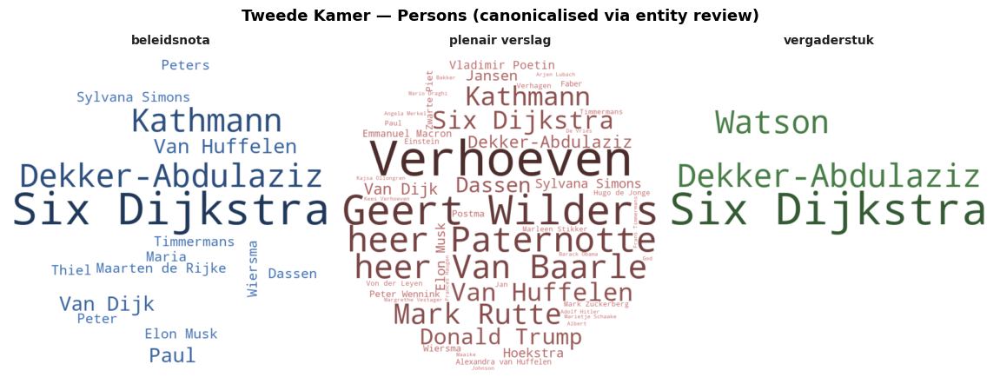

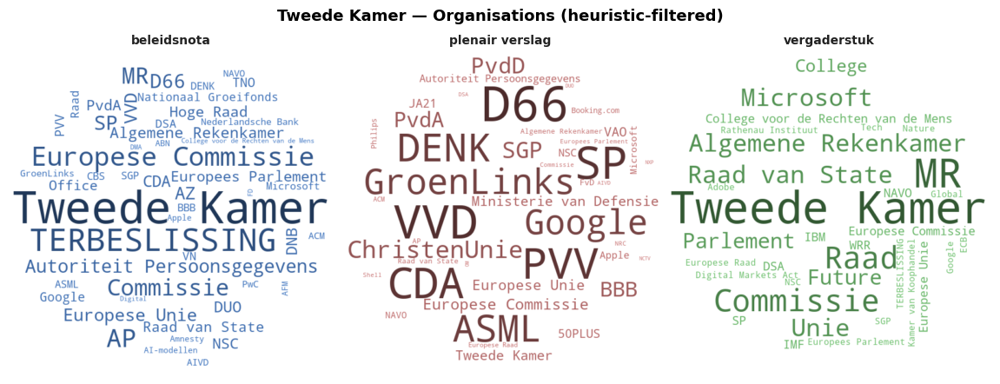

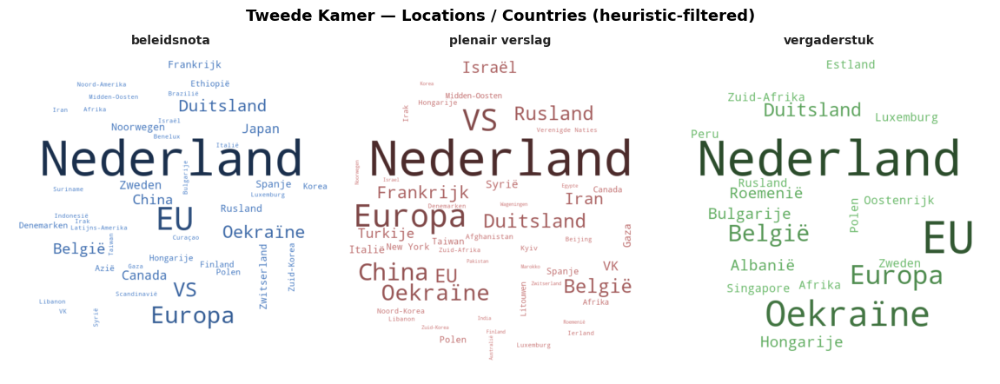

In [94]:
plot_wordclouds(tk_per, "group", TK_TINTS, 3,
    "Tweede Kamer — Persons (canonicalised via entity review)")
plot_wordclouds(tk_org, "group", TK_TINTS, 3,
    "Tweede Kamer — Organisations (heuristic-filtered)")
plot_wordclouds(tk_loc, "group", TK_TINTS, 3,
    "Tweede Kamer — Locations / Countries (heuristic-filtered)")

## Step 6 — Word clouds per talkshow program

Source: `subtitles/analysis/subs_with_NER.csv`
Groups: one cloud per talk-show programme.


In [96]:
SUBS_CSV = HERE / "../../../subtitles/analysis/subs_with_NER.csv"

PROG_LABELS = {
    "goedemorgen nederland": "Goedemorgen Nederland",
    "de wereld draait door":  "DWDD",
    "eva":                    "Eva",
    "jinek":                  "Jinek",
    "bar laat":               "Bar Laat",
    "pauw":                   "Pauw",
    "café kockelmann":        "Café Kockelmann",
    "de vooravond":           "De Vooravond",
    "m":                      "M",
}

def build_prog_tints(programs):
    cmap = mcm.get_cmap("tab20b", len(programs))
    tints = {}
    for i, p in enumerate(sorted(programs)):
        r, g, b, _ = cmap(i)
        h, s, v = mcolors.rgb_to_hsv((r, g, b))
        dark = mcolors.hsv_to_rgb((h, min(1.0, s + 0.2), max(0.2, v - 0.3)))
        tints[PROG_LABELS.get(p, p.title())] = mcolors.to_hex(dark)
    return tints

def _load_subs(col, canon_map):
    """Load one entity-type column from the subs CSV with canonical mapping."""
    df = load_tk_col_cleaned(SUBS_CSV, col, canon_map, group_col="program")
    df["group"] = df["group"].map(lambda p: PROG_LABELS.get(p, p.title()))
    return df

subs_per = _load_subs("persons",   CANON_PER)
subs_org = _load_subs("orgs",      CANON_ORG)
subs_loc = _load_subs("countries", CANON_LOC)

# subs_raw kept as alias for Variant cells that still reference it
subs_raw = subs_per

prog_tints = build_prog_tints(PROG_LABELS.keys())

for label, df in [("PER", subs_per), ("ORG", subs_org), ("LOC", subs_loc)]:
    print(f"\n{label}:")
    for grp in sorted(df["group"].unique()):
        n = df[df["group"] == grp]["count"].sum()
        print(f"  {grp}: {n:,} mentions")


PER:
  Bar Laat: 14 mentions
  Café Kockelmann: 22 mentions
  DWDD: 81 mentions
  De Vooravond: 3 mentions
  Eva: 66 mentions
  Goedemorgen Nederland: 135 mentions
  Jinek: 7 mentions
  M: 2 mentions
  Pauw: 15 mentions

ORG:
  Bar Laat: 16 mentions
  Café Kockelmann: 19 mentions
  DWDD: 45 mentions
  De Vooravond: 2 mentions
  Eva: 64 mentions
  Goedemorgen Nederland: 263 mentions
  Jinek: 8 mentions
  M: 1 mentions
  Pauw: 9 mentions

LOC:
  Bar Laat: 48 mentions
  Café Kockelmann: 49 mentions
  DWDD: 94 mentions
  De Vooravond: 3 mentions
  Eva: 117 mentions
  Goedemorgen Nederland: 576 mentions
  Jinek: 34 mentions
  M: 8 mentions
  Pauw: 37 mentions


Saved → wordclouds_talkshows_per.png


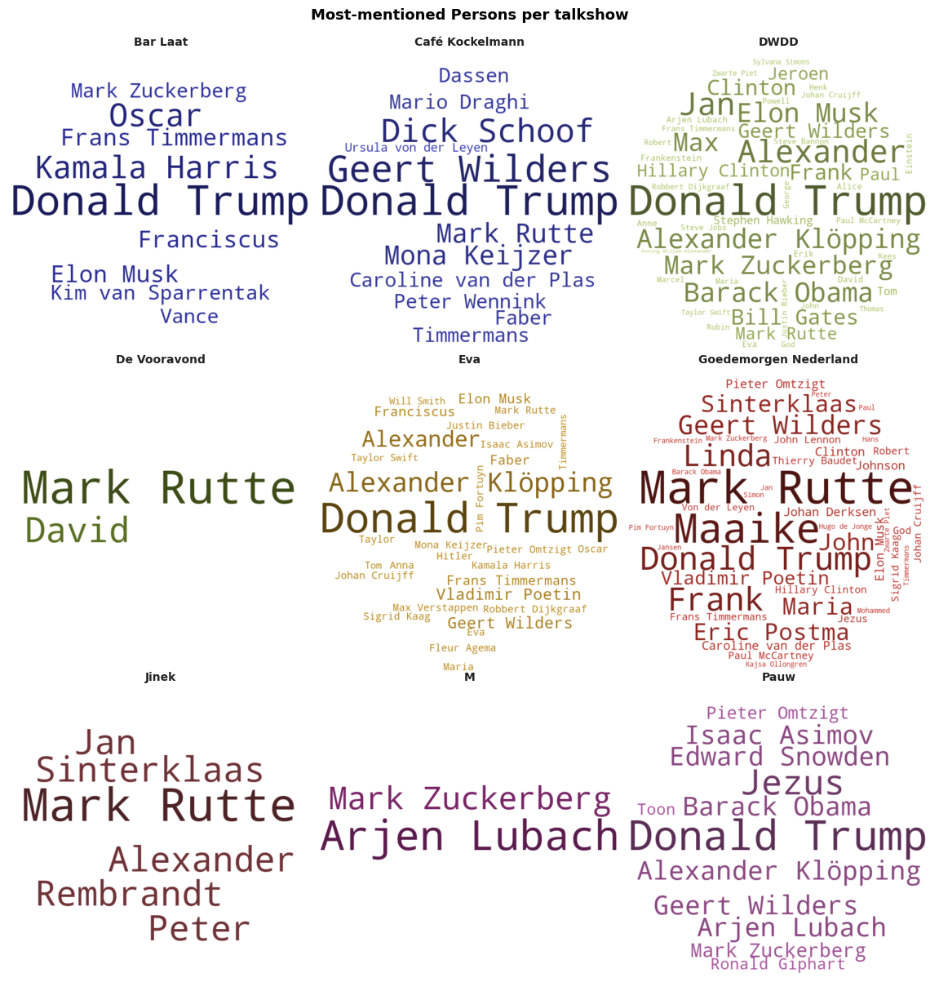

Saved → wordclouds_talkshows_org.png


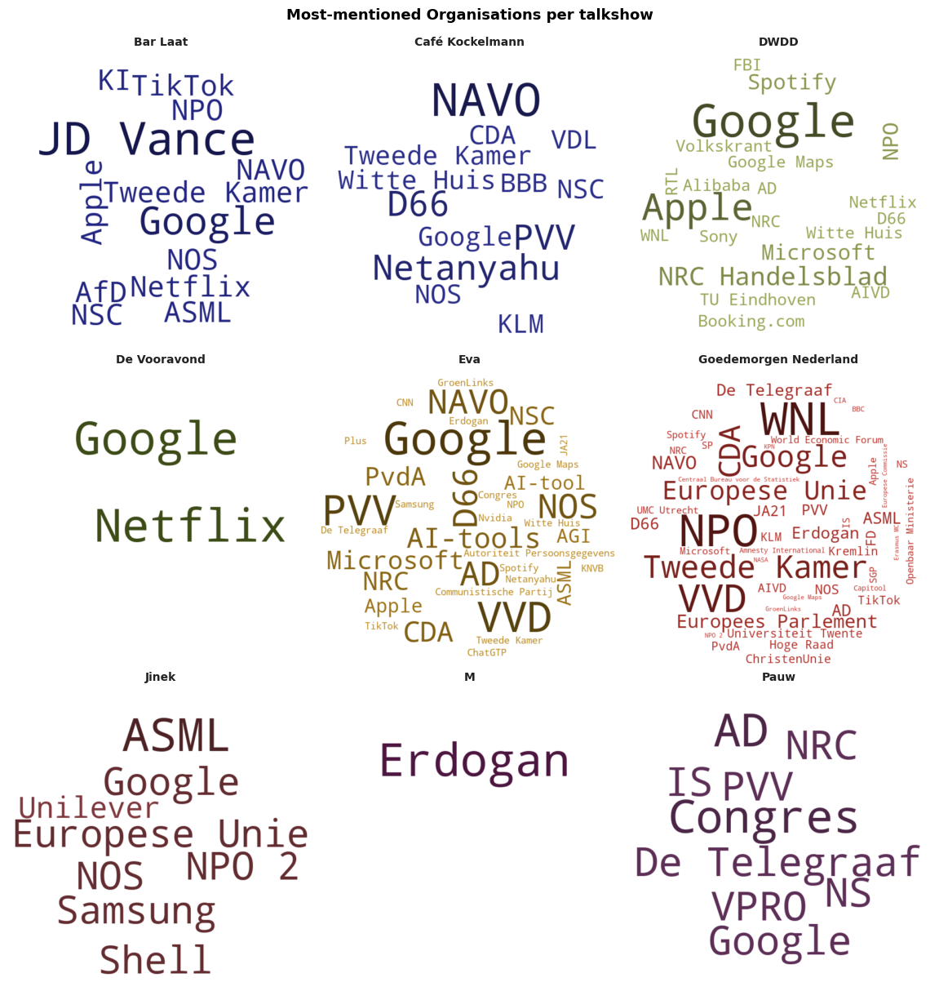

Saved → wordclouds_talkshows_loc.png


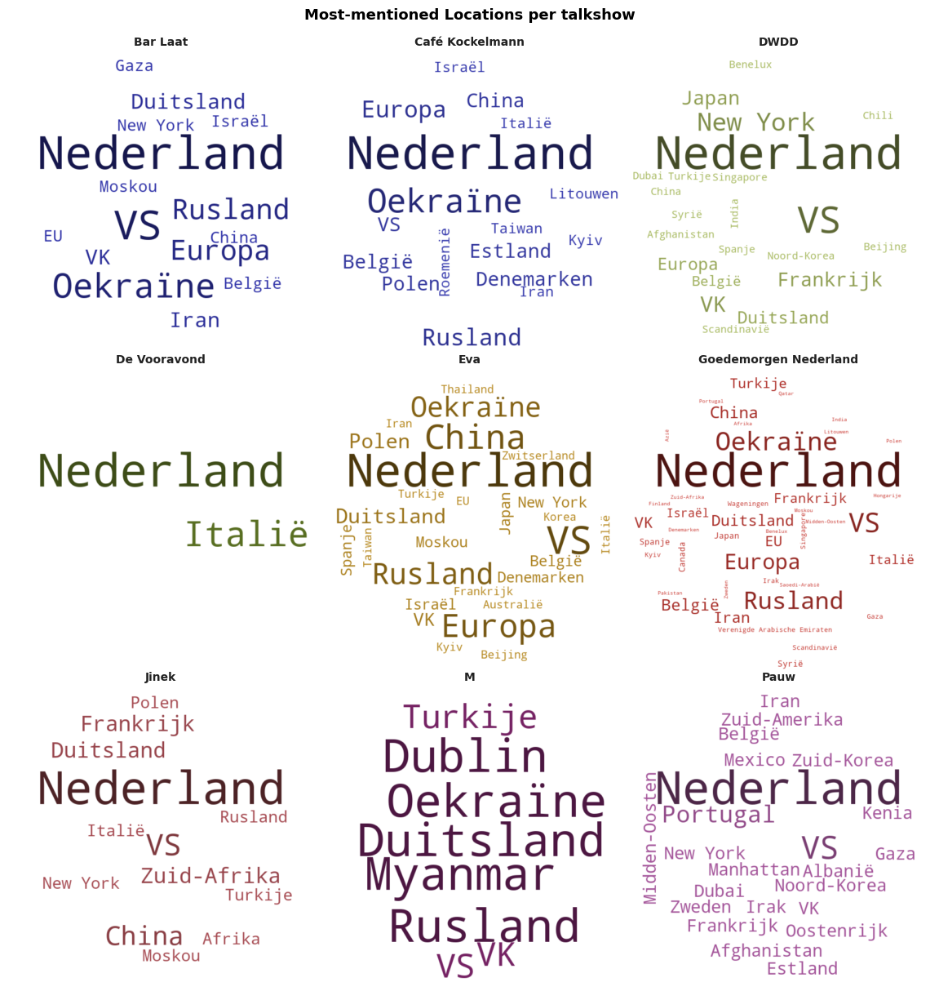

In [97]:
OUT_SUBS = HERE / f"wordclouds_talkshows_{ENTITY_TYPE.lower()}.png"

for _etype, _df, _fname in [("Persons",       subs_per, "per"),
                              ("Organisations",  subs_org, "org"),
                              ("Locations",      subs_loc, "loc")]:
    plot_wordclouds(_df, "group", prog_tints, 3,
        f"Most-mentioned {_etype} per talkshow",
        out_path=HERE / f"wordclouds_talkshows_{_fname}.png")

## Step 7 — Summary: top entities for TK types and talkshows

In [ ]:
print("=" * 52)
print("TOP ENTITIES PER TK DOC TYPE — PER (canonicalised)")
print("=" * 52)
top_entities_table(tk_per, "group", n=8)

print()
print("=" * 52)
print("TOP ENTITIES PER TK DOC TYPE — ORG (filtered)")
print("=" * 52)
top_entities_table(tk_org, "group", n=8)

print()
print("=" * 52)
print("TOP ENTITIES PER TK DOC TYPE — LOC (filtered)")
print("=" * 52)
top_entities_table(tk_loc, "group", n=8)

print()
print("=" * 52)
print(f"TOP ENTITIES PER TALKSHOW  (type={ENTITY_TYPE})")
print("=" * 52)
top_entities_table(subs_raw, "group", n=8)

TOP ENTITIES PER TK DOC TYPE — PER (canonicalised)
────────────────────────────────────────────────
  beleidsnota
             entity  count
1      Six Dijkstra     17
2  Dekker-Abdulaziz     12
3          Kathmann     12
4              Paul      3
5          Van Dijk      3
6      Van Huffelen      3
7            Dassen      1
8         Elon Musk      1
────────────────────────────────────────────────
  plenair verslag
            entity  count
1        Verhoeven     41
2    Geert Wilders     27
3  heer Paternotte     23
4  heer Van Baarle     23
5       Mark Rutte     17
6         Kathmann     15
7     Six Dijkstra     13
8     Van Huffelen     13
────────────────────────────────────────────────
  vergaderstuk
             entity  count
1      Six Dijkstra      2
2  Dekker-Abdulaziz      1
3            Watson      1
────────────────────────────────────────────────

TOP ENTITIES PER TK DOC TYPE — ORG (filtered)
────────────────────────────────────────────────
  beleidsnota
           

---
## Variant A — Proportional (share of group mentions)

Font size ∝ entity's **share of total NER mentions within each group** instead of raw count.  
Makes font sizes comparable across groups of different sizes.

In [ ]:
def proportional(df):
    """Replace raw counts with within-group share (× 10 000 to keep integers)."""
    totals = df.groupby("group")["count"].transform("sum")
    out = df.copy()
    out["count"] = (df["count"] / totals * 10_000).round().astype(int)
    return out[out["count"] > 0]

for _etype, _df in [("Persons", src_per), ("Organisations", src_org), ("Locations", src_loc)]:
    plot_wordclouds(proportional(_df), "group", src_tint_map, 4,
        f"Proportional — {_etype} per news source (share of mentions)")

for _etype, _df in [("Persons", meta_per), ("Organisations", meta_org), ("Locations", meta_loc)]:
    _d = _df.copy(); _d["group"] = _d["group"].apply(abbrev)
    plot_wordclouds(proportional(_d), "group", meta_tints_disp, 4,
        f"Proportional — {_etype} per meta-topic (share of mentions)")

for _etype, _df in [("Persons", tk_per), ("Organisations", tk_org), ("Locations", tk_loc)]:
    plot_wordclouds(proportional(_df), "group", TK_TINTS, 3,
        f"Proportional — Tweede Kamer {_etype} (share of mentions)")

for _etype, _df in [("Persons", subs_per), ("Organisations", subs_org), ("Locations", subs_loc)]:
    plot_wordclouds(proportional(_df), "group", prog_tints, 3,
        f"Proportional — {_etype} per talkshow (share of mentions)")

---
## Variant B — Excluding Donald Trump

Same raw counts as the main version, but with all Trump-name variants removed.  
Useful to see which entities dominate once the most frequent name is stripped out.

In [ ]:
TRUMP_VARIANTS = {"donald trump", "trump", "d. trump", "d trump"}

def drop_trump_all(df):
    out = df[~df["entity"].str.lower().isin(TRUMP_VARIANTS)].copy()
    n = len(df) - len(out)
    if n: print(f"  Removed {n} Trump rows")
    return out

for _etype, _df in [("Persons", src_per), ("Organisations", src_org), ("Locations", src_loc)]:
    plot_wordclouds(drop_trump_all(_df), "group", src_tint_map, 4,
        f"{_etype} per news source (excl. Trump)")

for _etype, _df in [("Persons", meta_per), ("Organisations", meta_org), ("Locations", meta_loc)]:
    _d = drop_trump_all(_df).copy(); _d["group"] = _d["group"].apply(abbrev)
    plot_wordclouds(_d, "group", meta_tints_disp, 4,
        f"{_etype} per meta-topic (excl. Trump)")

for _etype, _df in [("Persons", tk_per), ("Organisations", tk_org), ("Locations", tk_loc)]:
    plot_wordclouds(drop_trump_all(_df), "group", TK_TINTS, 3,
        f"Tweede Kamer {_etype} (excl. Trump)")

for _etype, _df in [("Persons", subs_per), ("Organisations", subs_org), ("Locations", subs_loc)]:
    plot_wordclouds(drop_trump_all(_df), "group", prog_tints, 3,
        f"{_etype} per talkshow (excl. Trump)")